In [1]:
# directory
import os
import zipfile
import shutil
import random
from tqdm import tqdm

# dataframe
import pandas as pd
import numpy as np

# visualization
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import metrics
from sklearn.utils import resample
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import train_test_split

# image processing
import cv2
from PIL import Image
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, Flatten, Dense, Dropout, MaxPooling2D, BatchNormalization
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.callbacks import EarlyStopping, Callback , ModelCheckpoint
# from tensorflow.keras.metrics import Accuracy, binary_crossentropy, FalsePositives, FalseNegatives, TruePositives, TrueNegatives
from tensorflow.keras.preprocessing.image import ImageDataGenerator

2023-08-17 17:54:03.500913: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-08-17 17:54:03.832995: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-17 17:54:04.828155: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
# with zipfile.ZipFile('archive.zip', 'r') as zip_ref:
#     zip_ref.extractall('breakhis')

In [3]:
df = pd.read_csv('breakhis/Folds.csv')

root_dir = 'breakhis/'

In [4]:
df.head()

,fold,mag,grp,filename
0,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
1,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
2,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
3,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
4,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...


In [5]:
df = df.rename(columns={'filename': 'path'})

- Folds..csv contains images information that consist of magnitude, group (train, test), and path

before restructuring directory, we will add label to image file name for error analysis later

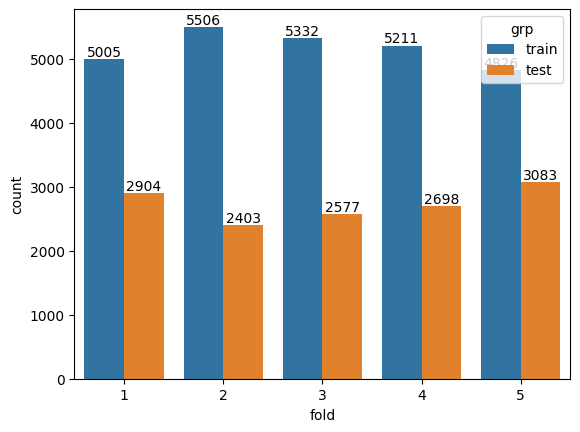

In [6]:
ax = sns.countplot(data=df, x='fold', hue='grp')
for container in ax.containers:
    ax.bar_label(container)

- It seems that fold is like proportion of train and test. Each folds contains 7909 images. Fold 2 contains most training data than other folds. So, we will choose fold 2.

In [7]:
df = (df[df['fold'] == 2].drop(columns='fold', axis=1)
                         .reset_index(drop=True))

df.shape

(7909, 3)

In [8]:
df['mag'] = df['mag'].astype('str')
df['type'] = df['path'].apply(lambda x: x.split('/')[5])
df['filename'] = df['path'].apply(lambda x: x.split('/')[-1])
df['path'] = df['path'].apply(lambda x: os.path.join('breakhis', x))
df['label'] = df['path'].apply(lambda x: x.split('/')[4])
df['filename'] = df['label'] + '_' + df['filename']
df['class'] = df['label'].apply(lambda x: 1 if x == 'malignant' else 0)

df.head()

,mag,grp,path,type,filename,label,class
0,100,train,breakhis/BreaKHis_v1/histology_slides/breast/b...,adenosis,benign_SOB_B_A-14-22549AB-100-001.png,benign,0
1,100,train,breakhis/BreaKHis_v1/histology_slides/breast/b...,adenosis,benign_SOB_B_A-14-22549AB-100-002.png,benign,0
2,100,train,breakhis/BreaKHis_v1/histology_slides/breast/b...,adenosis,benign_SOB_B_A-14-22549AB-100-003.png,benign,0
3,100,train,breakhis/BreaKHis_v1/histology_slides/breast/b...,adenosis,benign_SOB_B_A-14-22549AB-100-004.png,benign,0
4,100,train,breakhis/BreaKHis_v1/histology_slides/breast/b...,adenosis,benign_SOB_B_A-14-22549AB-100-005.png,benign,0


In [9]:
df['path'][0]

'breakhis/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549AB/100X/SOB_B_A-14-22549AB-100-001.png'

In [10]:
train_df = df[df['grp'] == 'train']
test_df = df[df['grp'] == 'test']

In [11]:
train_df.shape, test_df.shape

((5506, 7), (2403, 7))

[Text(0, 0, '1756'), Text(0, 0, '3750')]

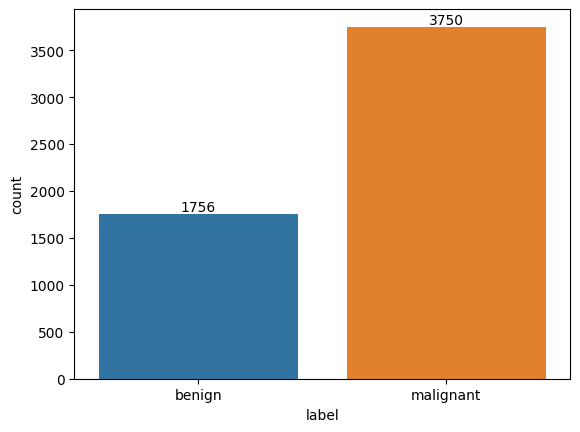

In [12]:
ax = sns.countplot(data=train_df, x='label')
ax.bar_label(ax.containers[0])

[Text(0, 0, '253'), Text(0, 0, '782'), Text(0, 0, '393'), Text(0, 0, '328')]

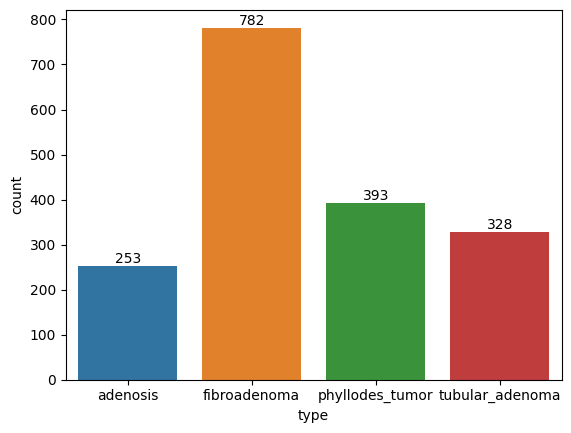

In [13]:
ax = sns.countplot(data=train_df[train_df['label']=='benign'], x='type')
ax.bar_label(ax.containers[0])

[Text(0, 0, '2531'), Text(0, 0, '351'), Text(0, 0, '460'), Text(0, 0, '408')]

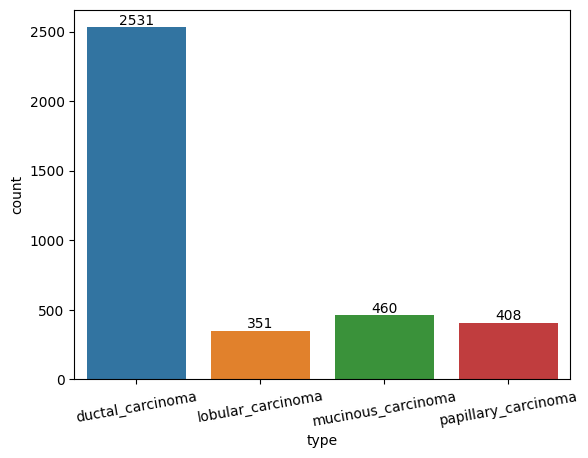

In [14]:
ax = sns.countplot(data=train_df[train_df['label']=='malignant'], x='type')
ax.set_xticklabels(ax.get_xticklabels(), rotation=10)
ax.bar_label(ax.containers[0])

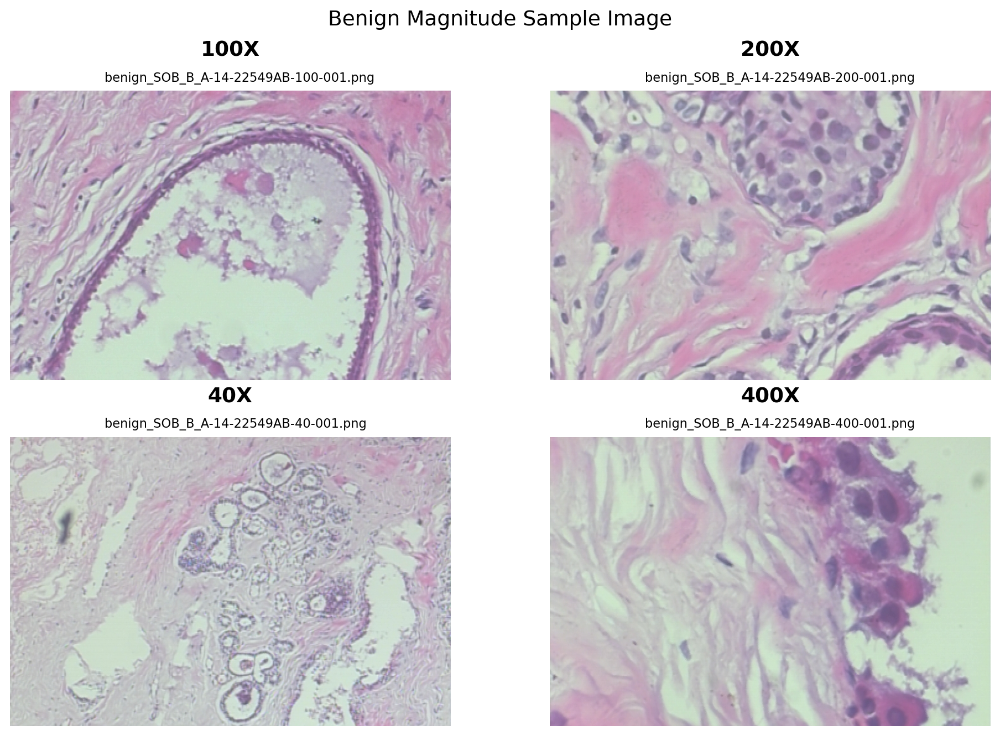

In [15]:
fig, axes = plt.subplots(2, 2, figsize=(11, 7.5), dpi=180, tight_layout=True)
sample_images = train_df.groupby("mag", as_index=False).first()

for ax, row in zip(axes.flat, sample_images.itertuples()):
    img = cv2.imread(row.path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    ax.imshow(img_rgb)
    ax.set_title(f"{row.mag}X", size=15, pad=25, weight=600)
    ax.text(150, -15, row.filename, size=9)
    ax.axis("off")

plt.suptitle('Benign Magnitude Sample Image', fontsize=15)
plt.show()

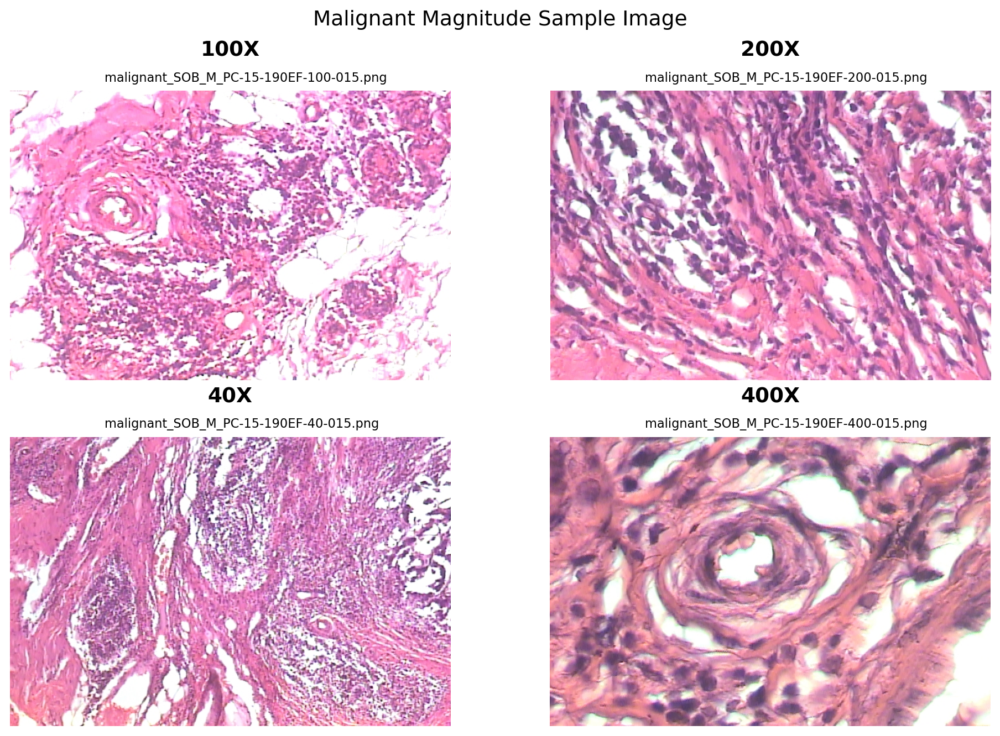

In [16]:
fig, axes = plt.subplots(2, 2, figsize=(11, 7.5), dpi=180, tight_layout=True)
sample_images = train_df[train_df['filename'].apply(lambda x: x.split('-')[-1]=='015.png')].groupby("mag", as_index=False).last() 

for ax, row in zip(axes.flat, sample_images.itertuples()):
    img = cv2.imread(row.path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    ax.imshow(img_rgb)
    ax.set_title(f"{row.mag}X", size=15, pad=25, weight=600)
    ax.text(150, -15, row.filename, size=9)
    ax.axis("off")

plt.suptitle('Malignant Magnitude Sample Image', fontsize=15)
plt.show()

### Arranging Path 

- The dataset used in this project consist of complex directory structure.
- BreaKHis_v1/
    - histology_slides/
        - breast/
            - __benign__/
                - SOB/
                    - Type (adenosis - fibroadenoma - phyllodes_tumor - fibroadenoma)/
                        - ID/
                            - magnitude (40X - 100X - 200X - 400X)/
                                - images'
            - __malignant__/
                - SOB/
                    - Type (Ductal Carcinoma - lobular_carcinoma - mucinous_carcinoma - papillary_carcinoma)/
                        - ID/
                            - magnitude (40X - 100X - 200X - 400X)/
                                - images
                                
                                
- before input the dataset into model, restructure the directory to for easier readibility:
- dataset/
    - train/
        - class/
            - images
    - validation/
        - class/
            - images
    - test/
        - class/
            - images

In [17]:
root_dir = '/tmp'
train_dir =  os.path.join(root_dir,'breastcancer','train')
train_malignant_dir = os.path.join(train_dir,'malignant')
train_benign_dir = os.path.join(train_dir,'benign')

val_dir =  os.path.join(root_dir,'breastcancer','val')
val_malignant_dir = os.path.join(val_dir,'malignant')
val_benign_dir = os.path.join(val_dir,'benign')

test_dir = os.path.join(root_dir,'breastcancer','test')
test_malignant_dir = os.path.join(test_dir,'malignant')
test_benign_dir = os.path.join(test_dir,'benign')

In [18]:
os.makedirs('/tmp/breastcancer', exist_ok=True)
os.makedirs(os.path.join(root_dir, 'breastcancer'), exist_ok=True)

os.makedirs(train_dir, exist_ok=True)
os.makedirs(train_benign_dir, exist_ok=True)
os.makedirs(train_malignant_dir, exist_ok=True)

os.makedirs(val_dir, exist_ok=True)
os.makedirs(val_benign_dir, exist_ok=True)
os.makedirs(val_malignant_dir, exist_ok=True)

os.makedirs(test_dir, exist_ok=True)
os.makedirs(test_benign_dir, exist_ok=True)
os.makedirs(test_malignant_dir, exist_ok=True)

In [19]:
# split train data into train and validation
train_df1, val_df = train_test_split(train_df, test_size=0.2, random_state=0)

print(f"Train size: {train_df1.shape[0]} images")
print(f"Validation size: {val_df.shape[0]} images")
print(f"Test size: {test_df.shape[0]} images")

Train size: 4404 images
Validation size: 1102 images
Test size: 2403 images


Text(0.5, 1.0, 'Test data')

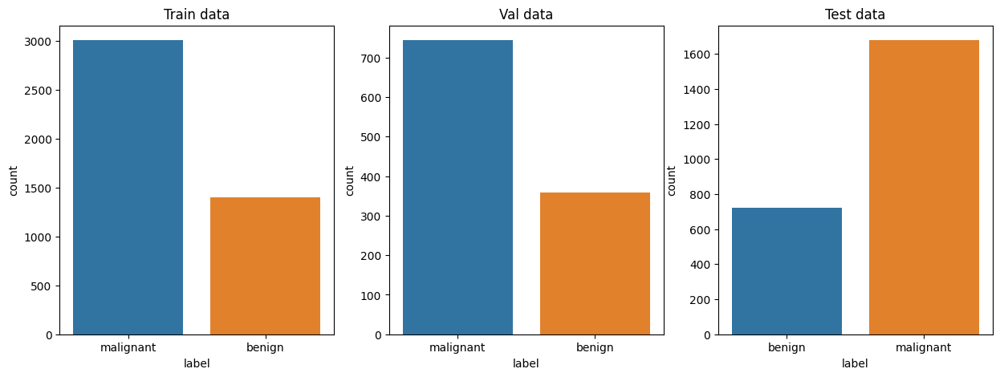

In [20]:
fig, axs = plt.subplots(1,3, figsize=(15,5))
sns.countplot(data=train_df1, x='label', ax=axs[0])
axs[0].set_title('Train data')

sns.countplot(data=val_df, x='label', ax=axs[1])
axs[1].set_title('Val data')

sns.countplot(data=test_df, x='label', ax=axs[2])
axs[2].set_title('Test data')

In [21]:
# benign_df = train_df1[train_df1['class']==0]
# malignant_df = train_df1[train_df1['class']==1]

# benign_df.shape, malignant_df.shape

In [22]:
# benign_df_upsample = resample(benign_df, n_samples=len(malignant_df), random_state=0, replace=True)
# train_df1 = pd.concat([malignant_df, benign_df_upsample])

In [23]:
# fig, axs = plt.subplots(1,3, figsize=(15,5))
# sns.countplot(data=train_df1, x='label', ax=axs[0])
# axs[0].set_title('Train data')
# axs[0].bar_label(axs[0].containers[0])

# sns.countplot(data=val_df, x='label', ax=axs[1])
# axs[1].set_title('Val data')
# axs[1].bar_label(axs[1].containers[0])

# sns.countplot(data=test_df, x='label', ax=axs[2])
# axs[2].set_title('Test data')
# axs[2].bar_label(axs[2].containers[0])

In [24]:
def arrange_dir(train_dir, test_dir, val_dir):
    for subdir, df_slice in zip([train_dir, test_dir, val_dir], [train_df1, test_df, val_df]):
        for i, (_, row) in tqdm(enumerate(df_slice.iterrows(), start=1)):
            src = row['path']
            target = row['class']
            
            if target == 1:
                class_name='malignant'
            else:
                class_name='benign'
            
            class_dir = os.path.join(subdir, class_name)
            # os.makedirs(class_dir, exist_ok=True)
            if df_slice is train_df1:
                img_filename = f"image{i}.png"
            else:
                img_filename = class_name + '_' + os.path.basename(src)
            
            dest = os.path.join(class_dir, img_filename)
            shutil.copyfile(src, dest)

In [25]:
arrange_dir(train_dir, test_dir, val_dir)

4404it [00:17, 254.03it/s]
2403it [00:09, 263.51it/s]
1102it [00:02, 549.31it/s]


In [26]:
# check the number of images in each directory
for img in [train_malignant_dir, train_benign_dir, val_malignant_dir, val_benign_dir, test_malignant_dir, test_benign_dir]:
    print(f"There is {len(os.listdir(img))} images in {' '.join([w for w in img.split('/')[-2:]])} data")

There is 3006 images in train malignant data
There is 1398 images in train benign data
There is 744 images in val malignant data
There is 358 images in val benign data
There is 1679 images in test malignant data
There is 724 images in test benign data


In [27]:
train_bening_fnames = os.listdir(train_benign_dir)
train_malignant_fnames = os.listdir(train_malignant_dir)

print(train_bening_fnames[:10])
print(train_malignant_fnames[:10])

['image295.png', 'image4402.png', 'image2270.png', 'image3954.png', 'image90.png', 'image1993.png', 'image2570.png', 'image681.png', 'image2935.png', 'image966.png']
['image2667.png', 'image3677.png', 'image3545.png', 'image1218.png', 'image3384.png', 'image1730.png', 'image723.png', 'image4088.png', 'image880.png', 'image4109.png']


In [28]:
import matplotlib.image as mpimg

def show_random_images(dir_path, class_name, num_images=8):
    class_dir = os.path.join(dir_path, class_name)
    image_files = os.listdir(class_dir)
    random_images = random.sample(image_files, min(num_images, len(image_files)))

    plt.figure(figsize=(15, 10))
    for i, image_filename in enumerate(random_images, start=1):
        image_path = os.path.join(class_dir, image_filename)
        image = mpimg.imread(image_path)
        
        plt.subplot(2, 4, i)
        plt.imshow(image)
        plt.title(f"Image {i}")
        plt.axis('off')
    
    plt.suptitle(f'\n{class_name} Sample Images',fontsize=15, weight=300)
    plt.tight_layout()
    plt.show()

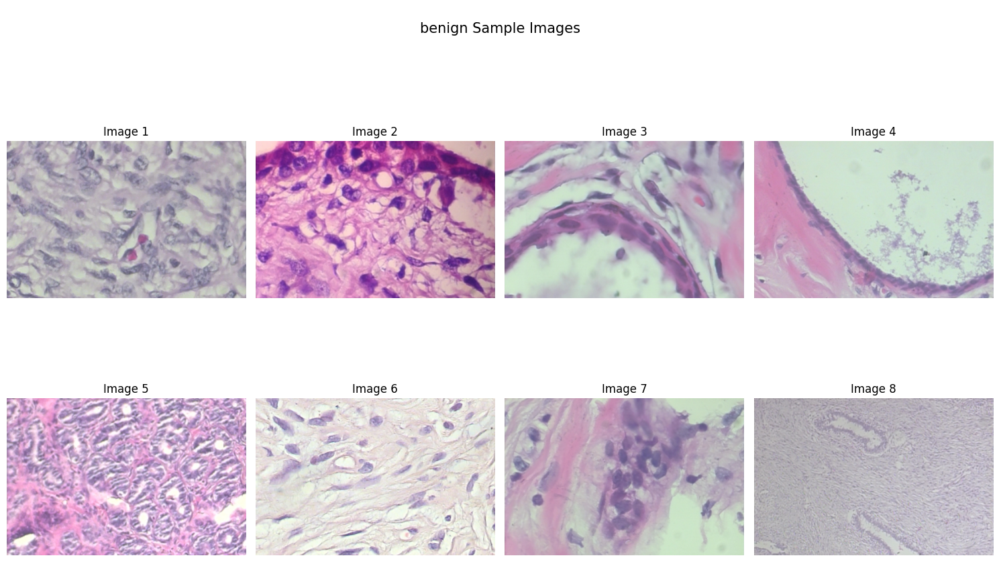

In [29]:
show_random_images(train_dir, 'benign')

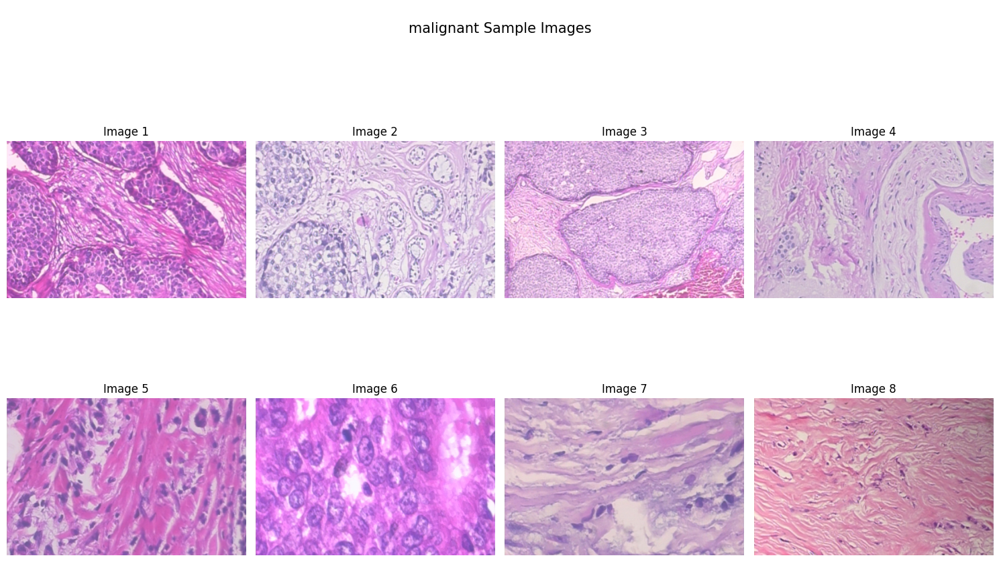

In [30]:
show_random_images(train_dir, 'malignant')

# Image data Generator

In [31]:
def train_val_generators(train_dir, val_dir):
    """
    Creates the training and validation data generators

    Args:
    TRAINING_DIR (string): directory path containing the training images
    VALIDATION_DIR (string): directory path containing the testing/validation images

    Returns:
    train_generator, validation_generator - tuple containing the generators
    """

    # Instantiate the ImageDataGenerator class (don't forget to set the arguments to augment the images)
    train_datagen = ImageDataGenerator(rescale=1./255,
                                       rotation_range=20,
                                       shear_range=0.2,
                                       height_shift_range=0.2,
                                       width_shift_range=0.2,
                                       horizontal_flip=True,
                                       vertical_flip=True,
                                       brightness_range=[0.4,1.5],
                                       fill_mode='nearest')

    # Pass in the appropriate arguments to the flow_from_directory method
    train_generator = train_datagen.flow_from_directory(directory=train_dir,
                                                        batch_size=32,
                                                        class_mode='binary',
                                                        target_size=(224, 224))

    # Instantiate the ImageDataGenerator class
    validation_datagen = ImageDataGenerator(rescale=1./255)

    # Pass in the appropriate arguments to the flow_from_directory method
    validation_generator = validation_datagen.flow_from_directory(directory=val_dir,
                                                                  batch_size=32,
                                                                  class_mode='binary',
                                                                  target_size=(224, 224))
    ### END CODE HERE
    return train_generator, validation_generator

In [32]:
train_generator, validation_generator = train_val_generators(train_dir, val_dir)

Found 4404 images belonging to 2 classes.
Found 1102 images belonging to 2 classes.


# Model Creation

In [34]:
def create_model():
    
    model = Sequential([
        Conv2D(16, (3,3), activation='relu', input_shape=(224,224,3)),
        MaxPooling2D(2,2),
        
        Conv2D(32, (3,3), activation='relu'),
        MaxPooling2D(2,2),
        
        Conv2D(64, (3,3), activation='relu'),
        MaxPooling2D(2,2),
        
        Conv2D(128, (3,3), activation='relu'),
        MaxPooling2D(2,2),
        
        Conv2D(256, (3,3), activation='relu'),
        MaxPooling2D(2,2),
        
        Flatten(),
        Dense(128, activation='relu'),
        Dense(64, activation='relu'),
        Dense(32, activation='relu'),
        Dropout(0.3),
        Dense(1, activation='sigmoid')
    ])
    
    lr_schedule = tf.keras.optimizers.schedules.InverseTimeDecay(
        initial_learning_rate=0.001,
        decay_steps=1000,
        decay_rate=0.5,
    )
    
    model.compile(
        optimizer= tf.keras.optimizers.Adam(learning_rate=lr_schedule),
        loss='binary_crossentropy',
        metrics=[tf.keras.metrics.AUC(name="roc_auc")]
    )
    
    return model

In [35]:
# class myCallback(tf.keras.callbacks.Callback):
#     def on_epoch_end(self, epoch, logs={}):
#         if(logs.get('accuracy') > 0.90 and logs.get('val_accuracy') > 0.90):
#             print("\n Accuracy is > 90%!")
#             print("\nStop training...")
#             self.model.stop_training = True

# callback = myCallback()

callbacks = [
    EarlyStopping(
        monitor='val_roc_auc',
        # min_delta=1e-4,
        patience=3,
        verbose=1
    ),
    ModelCheckpoint(
        filepath='custom_model2.h5',
        save_best_only=True,
        verbose=1
    )
]

In [36]:
model = create_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 16)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 26, 26, 64)        0

2023-08-17 17:56:58.144994: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-08-17 17:56:58.270211: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-08-17 17:56:58.270261: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-08-17 17:56:58.272855: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-08-17 17:56:58.272896: I tensorflow/compile

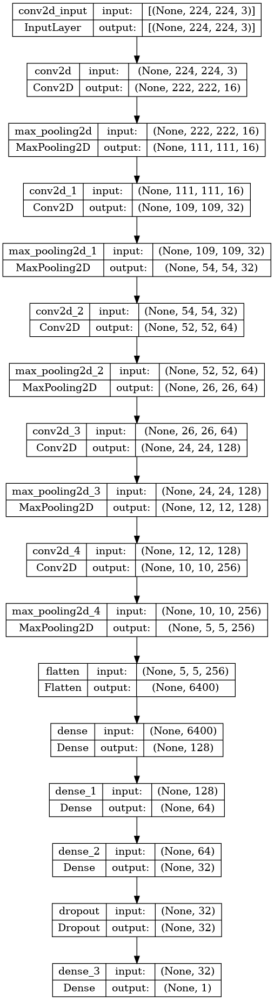

In [37]:
from tensorflow.keras.utils import plot_model
plot_model(model, show_shapes=True, show_layer_names=True)

In [38]:
history = model.fit(
    train_generator,
    epochs=50,
    verbose=1,
    validation_data=validation_generator,
    callbacks=[callbacks]
)

Epoch 1/50


2023-08-17 17:57:10.990812: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8904
2023-08-17 17:57:14.089332: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:606] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2023-08-17 17:57:14.125416: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x33eacea0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-08-17 17:57:14.125458: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3050 Laptop GPU, Compute Capability 8.6
2023-08-17 17:57:14.172892: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:255] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-08-17 17:57:14.548017: I ./tensorflow/compiler/jit/device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime o

138/138 [==============================] - ETA: 0s - loss: 0.5558 - roc_auc: 0.7430
Epoch 1: val_loss improved from inf to 0.50183, saving model to custom_model2.h5
138/138 [==============================] - 78s 485ms/step - loss: 0.5558 - roc_auc: 0.7430 - val_loss: 0.5018 - val_roc_auc: 0.8433
Epoch 2/50


/home/anggapark/miniconda3/envs/tf/lib/python3.9/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


138/138 [==============================] - ETA: 0s - loss: 0.5082 - roc_auc: 0.7927
Epoch 2: val_loss improved from 0.50183 to 0.42184, saving model to custom_model2.h5
138/138 [==============================] - 67s 488ms/step - loss: 0.5082 - roc_auc: 0.7927 - val_loss: 0.4218 - val_roc_auc: 0.8655
Epoch 3/50
138/138 [==============================] - ETA: 0s - loss: 0.4790 - roc_auc: 0.8124
Epoch 3: val_loss did not improve from 0.42184
138/138 [==============================] - 66s 476ms/step - loss: 0.4790 - roc_auc: 0.8124 - val_loss: 0.4265 - val_roc_auc: 0.8759
Epoch 4/50
138/138 [==============================] - ETA: 0s - loss: 0.4427 - roc_auc: 0.8405
Epoch 4: val_loss improved from 0.42184 to 0.38866, saving model to custom_model2.h5
138/138 [==============================] - 65s 467ms/step - loss: 0.4427 - roc_auc: 0.8405 - val_loss: 0.3887 - val_roc_auc: 0.8811
Epoch 5/50
138/138 [==============================] - ETA: 0s - loss: 0.4186 - roc_auc: 0.8538
Epoch 5: val_loss 

# Model Result

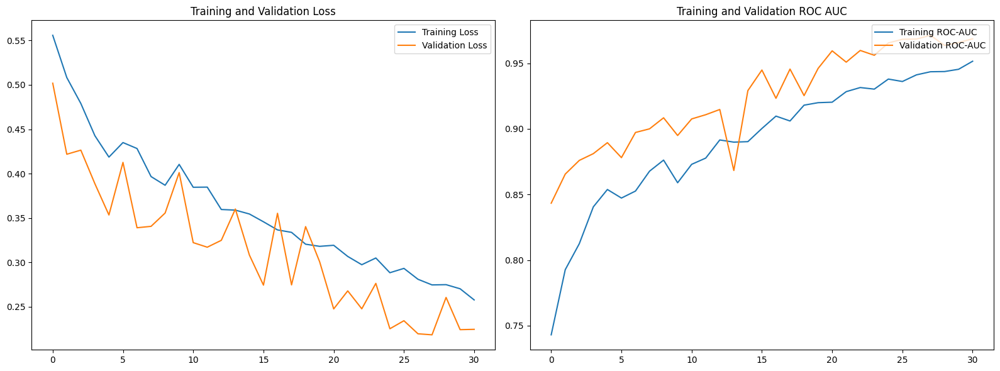

In [40]:
# Genning the roc auc
roc_auc = history.history['roc_auc']
val_roc_auc = history.history['val_roc_auc']

#Getting the losses
loss = history.history['loss']
val_loss = history.history['val_loss']

#No of epochs it trained
epochs_range = history.epoch

# Plotting Training and Validation accuracy
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

# Plotting Training and Validation Loss
ax[0].plot(epochs_range, loss, label='Training Loss')
ax[0].plot(epochs_range, val_loss, label='Validation Loss')
ax[0].legend(loc='upper right')
ax[0].set_title('Training and Validation Loss')

# Plotting Training and Validation ROC AUC
ax[1].plot(epochs_range, roc_auc, label='Training ROC-AUC')
ax[1].plot(epochs_range, val_roc_auc, label='Validation ROC-AUC')
ax[1].legend(loc='upper right')
ax[1].set_title('Training and Validation ROC AUC')

plt.tight_layout()
plt.show()

## Evaluate Model

In [41]:
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(directory=test_dir,
                                                  batch_size=1,
                                                  class_mode='binary',
                                                  shuffle=False,
                                                  target_size=(224, 224))

Found 2403 images belonging to 2 classes.


In [42]:
loss, roc_auc = model.evaluate(test_generator)

2403/2403 [==============================] - 26s 10ms/step - loss: 0.4754 - roc_auc: 0.8730


In [43]:
pred = model.predict(test_generator)
pred

2403/2403 [==============================] - 25s 10ms/step


array([[0.04081809],
       [0.14086016],
       [0.07741159],
       ...,
       [0.83028364],
       [0.6923034 ],
       [0.7224624 ]], dtype=float32)

In [45]:
# Convert predictions to class labels
pred_class = (pred > 0.5).astype('int').flatten()
pred_class

array([0, 0, 0, ..., 1, 1, 1])

In [46]:
# Get true labels from the test generator
true_class = test_generator.classes
true_class

array([0, 0, 0, ..., 1, 1, 1], dtype=int32)

In [49]:
model.save('custom_model.keras')

In [50]:
import itertools

def plot_confusion_matrix(ax, cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):

    print(cm)

    ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.set_title(title)
    # ax.colorbar()
    tick_marks = np.arange(len(classes))
    ax.set_xticks(tick_marks)
    ax.set_yticks(tick_marks)
    ax.set_xticklabels(classes)
    ax.set_yticklabels(classes)

    fmt = 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        ax.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    ax.set_ylabel('True label')
    ax.set_xlabel('Predicted label')
    

def plot_roc_curve(ax, fpr, tpr, roc_auc):

    ax.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    ax.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    # ax.set_title('Receiver Operating Characteristic for Class: ')
    ax.legend(loc="lower right")

[[ 593  131]
 [ 354 1325]]


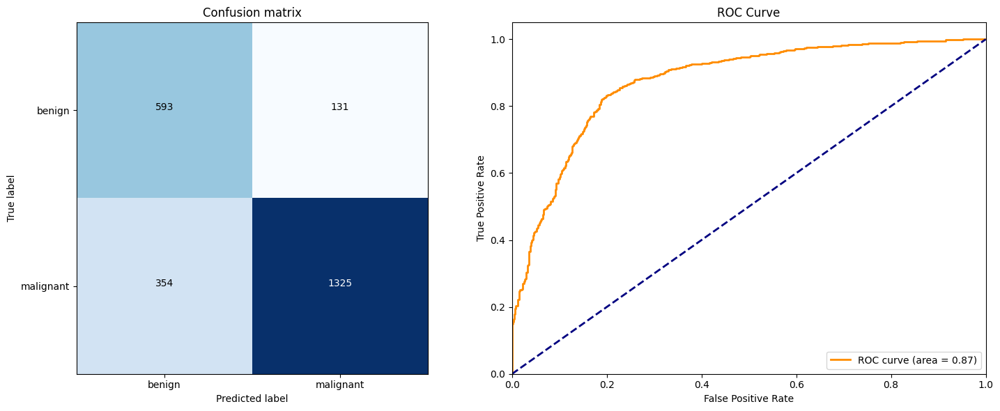

In [51]:
from sklearn.metrics import confusion_matrix, roc_curve, auc

cm = confusion_matrix(true_class, pred_class)


# Calculate ROC curve and AUC score
fpr, tpr, _ = roc_curve(true_class, pred)
roc_auc = auc(fpr, tpr)

# Plot confusion matrix and ROC curve in subplots
class_names = list(test_generator.class_indices.keys())
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# Plot confusion matrix
plot_confusion_matrix(axs[0], cm, class_names)

# Plot ROC curve
plot_roc_curve(axs[1], fpr, tpr, roc_auc)
axs[1].set_title('ROC Curve')

plt.tight_layout()
plt.show()